In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix
import streamlit as st
from io import StringIO
from sklearn.model_selection import GridSearchCV
import os
os.environ['LOKY_MAX_CPU_COUNT'] = '4'
import joblib
import time

## DATSET LOADING AND PRE PROCESS

In [9]:
df = pd.read_csv("Parkinson_Multiple_Sound_Recording/train_data.txt",header = None)
testdf = pd.read_csv("Parkinson_Multiple_Sound_Recording/test_data.txt",header = None)
# testdf2 = testdf.copy()

In [10]:
testdf.head()

,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,27
0,1,0.135,0.000007,0.067,0.078,0.202,2.033,0.178,1.074,1.336,...,184.502,187.880,183.0,182.0,0.005368,0.000025,0.0,0.0,0.0,1
1,1,0.143,0.000007,0.073,0.081,0.219,1.236,0.107,0.612,0.904,...,198.665,202.214,194.0,193.0,0.004988,0.000020,0.0,0.0,0.0,1
2,1,0.162,0.000008,0.087,0.089,0.260,1.338,0.117,0.630,0.948,...,197.220,206.060,198.0,197.0,0.004940,0.000046,0.0,0.0,0.0,1
3,1,0.140,0.000007,0.075,0.089,0.224,1.086,0.094,0.556,0.747,...,202.324,206.182,200.0,199.0,0.004900,0.000023,0.0,0.0,0.0,1
4,1,0.150,0.000007,0.080,0.097,0.240,1.049,0.091,0.533,0.698,...,205.407,209.927,204.0,203.0,0.004820,0.000022,0.0,0.0,0.0,1


In [11]:
df.describe()

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,28
count,1040.00000,1040.000000,1040.000000,1040.000000,1040.000000,1040.000000,1040.000000,1040.000000,1040.000000,1040.000000,...,1040.000000,1040.000000,1040.000000,1040.000000,1040.000000,1040.000000,1040.000000,1040.000000,1040.000000,1040.000000
mean,20.50000,2.679523,0.000170,1.247053,1.348327,3.741161,12.918391,1.194895,5.699600,7.983552,...,234.875990,109.744231,105.969231,0.006547,0.000843,27.682856,1.134615,12.370042,13.000000,0.500000
std,11.54895,1.765053,0.000106,0.979462,1.138742,2.938443,5.452204,0.420071,3.015183,4.840892,...,121.541243,150.027703,149.417074,0.001875,0.000723,20.975294,1.614764,15.161916,15.894745,0.500241
min,1.00000,0.190000,0.000006,0.062000,0.081000,0.185000,1.185000,0.103000,0.496000,0.708000,...,85.541000,0.000000,0.000000,0.002039,0.000055,0.000000,0.000000,0.000000,1.000000,0.000000
25%,10.75000,1.507500,0.000095,0.617000,0.665750,1.851750,9.353500,0.941000,3.703000,5.160250,...,143.650750,42.750000,40.750000,0.005039,0.000404,8.149250,0.000000,0.000000,1.000000,0.000000
50%,20.50000,2.396000,0.000151,1.035500,1.126500,3.107000,12.348500,1.181500,5.134500,7.050500,...,195.971000,65.000000,62.000000,0.006484,0.000644,26.501000,1.000000,5.826000,3.000000,0.500000
75%,30.25000,3.411500,0.000229,1.602500,1.694750,4.808500,15.493250,1.411000,6.942000,9.558930,...,263.798250,113.000000,109.000000,0.007923,0.000980,43.064250,1.000000,22.255500,23.250000,1.000000
max,40.00000,14.376000,0.000777,8.016000,13.542000,24.048000,41.137000,2.721000,25.820000,72.860000,...,597.974000,1490.000000,1489.000000,0.012070,0.006371,88.158000,12.000000,69.117000,55.000000,1.000000


In [12]:
missing_values = df.isnull().sum()
missing_percent = (missing_values / len(df)) * 100

missing_percent

0     0.0
1     0.0
2     0.0
3     0.0
4     0.0
5     0.0
6     0.0
7     0.0
8     0.0
9     0.0
10    0.0
11    0.0
12    0.0
13    0.0
14    0.0
15    0.0
16    0.0
17    0.0
18    0.0
19    0.0
20    0.0
21    0.0
22    0.0
23    0.0
24    0.0
25    0.0
26    0.0
27    0.0
28    0.0
dtype: float64

In [13]:
df.iloc[ : ,28].value_counts()
# # df.iloc[ : ,27].nunique()

28
1    520
0    520
Name: count, dtype: int64

## Spliting Test and Train X Y

In [14]:
from sklearn.model_selection import train_test_split

X = df.iloc[:,:-1]
y = df.iloc[:,-1]

xtrain,xtest,ytrain,ytest = train_test_split(X,y, test_size = 0.33,random_state = 45)

# xtest = testdf.iloc[:,:-1]
# ytest = testdf.iloc[:,-1]

scaler = StandardScaler()
xtrain_scale = scaler.fit_transform(xtrain)
xtest_scale = scaler.transform(xtest)

print('xtrain_scale _ shape',xtrain_scale.shape)
print('xtest_scale _ shape',xtest_scale.shape)
print('ytrain _ shape',ytrain.shape)
print('ytest _ shape',ytest.shape)

xtrain_scale _ shape (696, 28)
xtest_scale _ shape (344, 28)
ytrain _ shape (696,)
ytest _ shape (344,)


# Visualisation

## Train to Test PLOTTING

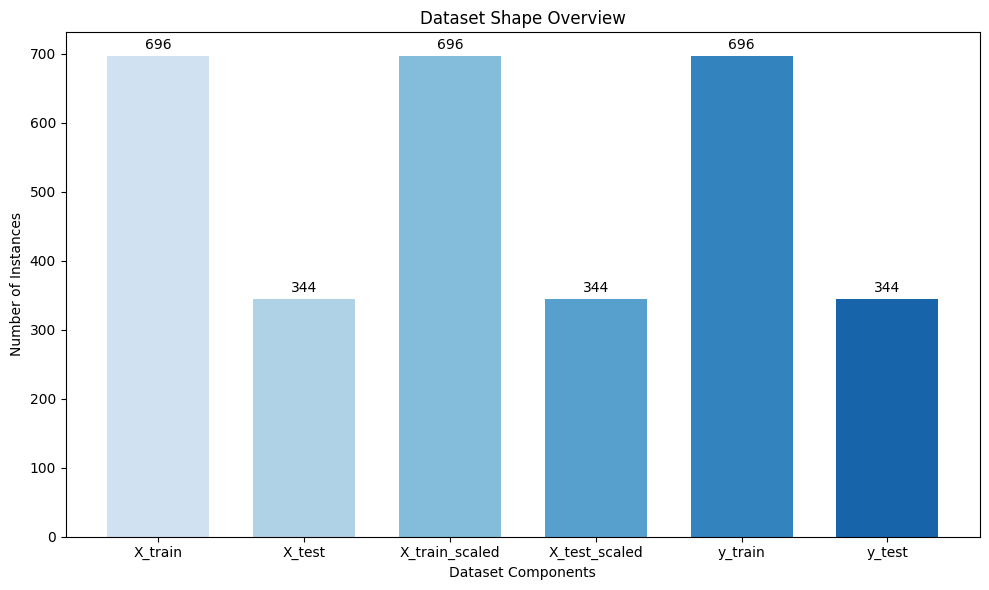

In [15]:
data = {
    'X_train': 696,
    'X_test': 344,
    'X_train_scaled': 696,
    'X_test_scaled': 344,
    'y_train': 696,
    'y_test': 344
}

labels = list(data.keys())
values = list(data.values())

# Create the bar chart
x = np.arange(len(labels))  # the label locations
width = 0.7  # the width of the bars
fig, ax = plt.subplots(figsize=(10, 6))
rects = ax.bar(x, values, width, label='Number of Instances', color=plt.cm.Blues(np.linspace(0.2, 0.8, len(values))))

# Add some text for labels, title and axes ticks
ax.set_ylabel('Number of Instances')
ax.set_xlabel('Dataset Components')
ax.set_title('Dataset Shape Overview')
ax.set_xticks(x)
ax.set_xticklabels(labels)

# Add the values on top of each bar
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects)

# Show the plot
plt.tight_layout()
plt.savefig("DatasetShapeOverview.png")
plt.show()



## DATA SET BOX PLOT

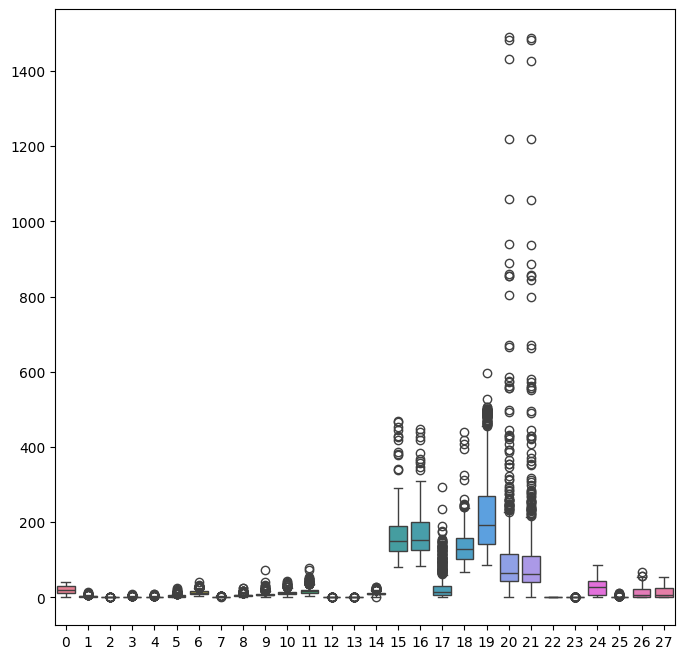

In [16]:
plt.figure(figsize=(8,8))
boxplot = sns.boxplot(xtrain)
plt.savefig('boxplt.png')

## CORRELATION MATRIX

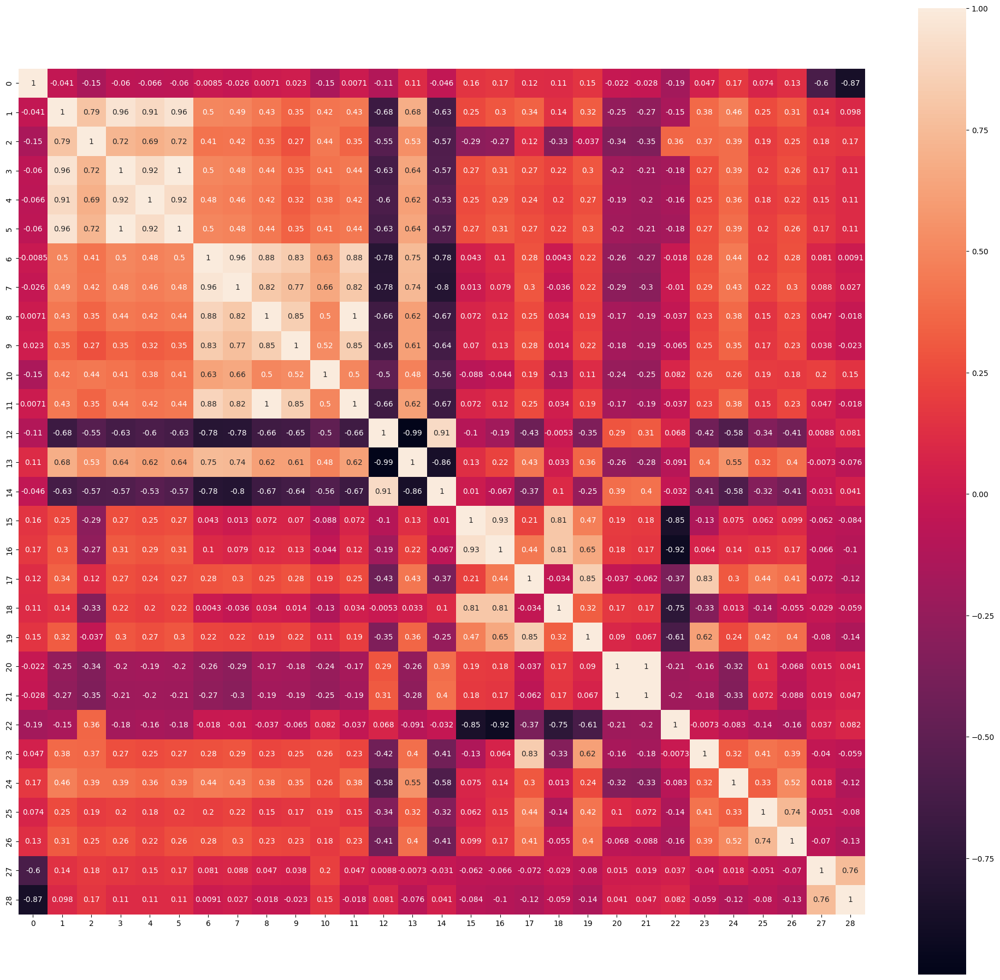

In [17]:
plt.figure(figsize=(25, 23))
corr = df.corr()
heatmap = sns.heatmap(corr, annot = True, square = True)

plt.savefig("Correlation Matrix Test Data.png")

## PAIR PLOT

In [18]:
pairplt = sns.pairplot(df)
plt.savefig('pairplt.png')

## Target Variable Histogram & Kde

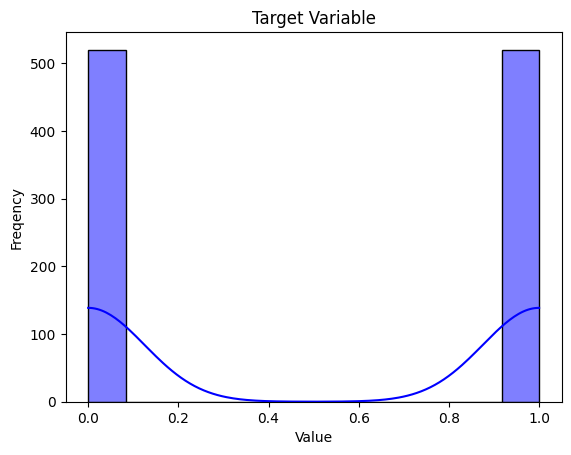

In [19]:
plt.clf()
sns.histplot(df.iloc[:,-1],kde = True,color = 'blue')
plt.ylabel("Freqency")
plt.xlabel("Value")
plt.title(f"Target Variable")
plt.savefig(f"hist n kde of Target Variable")

## Parameters Histogram & KDE

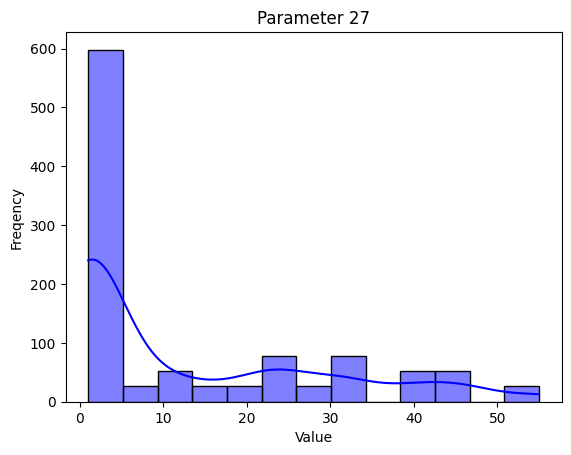

In [20]:
for i in range(0,28,1):
    plt.clf()
    sns.histplot(df.iloc[:,i],kde = True,color = 'blue')
    plt.ylabel("Freqency")
    plt.xlabel("Value")
    plt.title(f"Parameter {i}")
    plt.savefig(f"hist n kde param {i}")

In [21]:
plt.show()

# KNN CLASSIFIER MODEL

In [22]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score

In [25]:
knn = KNeighborsClassifier()
param_grid_knn = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski']
}

Results for KNN
              precision    recall  f1-score   support

     class 0       0.96      0.97      0.96       181
     class 1       0.97      0.95      0.96       163

    accuracy                           0.96       344
   macro avg       0.96      0.96      0.96       344
weighted avg       0.96      0.96      0.96       344

Training Accuracy: 1.0000
Test Accuracy: 0.9622
Cross-Validation Scores: [0.95       0.89928058 0.95683453 0.9352518  0.95683453]
Average CV Score: 0.9396402877697841


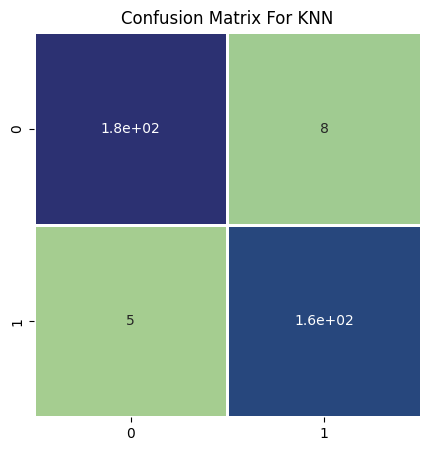

['knn_parkinson.pkl']

In [26]:
clf_knn = GridSearchCV(knn, param_grid_knn, cv=5, scoring='accuracy', n_jobs=-1)

start = time.time()
clf_knn.fit(xtrain_scale, ytrain)
end = time.time()
knn_time = end - start
ypred_knn = clf_knn.predict(xtest_scale)

accuracy_knn = accuracy_score(ytest,ypred_knn)

print("Results for KNN")

target_names = ['class 0', 'class 1']
report = classification_report(ytest, ypred_knn, target_names=target_names,zero_division=0)
print(report)

train_accuracy_knn = accuracy_score(ytrain, clf_knn.predict(xtrain_scale))
test_accuracy_knn = accuracy_score(ytest, clf_knn.predict(xtest_scale))

print(f"Training Accuracy: {train_accuracy_knn:.4f}")
print(f"Test Accuracy: {test_accuracy_knn:.4f}")

cv_scores = cross_val_score(clf_knn, xtrain_scale, ytrain, cv=5)
print(f"Cross-Validation Scores: {cv_scores}")
print(f"Average CV Score: {cv_scores.mean()}")

#confusion Matrix
cm_knn = confusion_matrix(ypred_knn,ytest)
plt.figure(figsize=(5,5))
plt.title("Confusion Matrix For KNN")
sns.heatmap(cm_knn,annot=True,cbar=False,cmap='crest',linewidth=2)
plt.savefig("Knn_cfm.png")
plt.show()

#save the model

joblib.dump(clf_knn,'knn_parkinson.pkl')


# Support Vector Machine

In [27]:
from sklearn import svm

# param_grid_svm = {
#     'C': [0.1, 1, 10],  # Regularization parameter
#     'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
#     'gamma': ['scale', 'auto']  # Kernel coefficient
# }
# clf_svc = GridSearchCV(svc, param_grid_svm, cv=5, scoring='accuracy', n_jobs=-1)

clf_svc = svm.SVC()

start = time.time()
clf_svc.fit(xtrain_scale,ytrain)
end = time.time()
svc_time = end - start
y_pred_svc = clf_svc.predict(xtest_scale)

accuracy_svc =  accuracy_score(ytest,y_pred_svc)
print("Accuracy of SVC MODEL = ",accuracy_svc)

Accuracy of SVC MODEL =  0.9912790697674418


Results for SVM
              precision    recall  f1-score   support

     class 0       0.99      0.99      0.99       181
     class 1       0.99      0.99      0.99       163

    accuracy                           0.99       344
   macro avg       0.99      0.99      0.99       344
weighted avg       0.99      0.99      0.99       344

Training Accuracy: 0.9986
Test Accuracy: 0.9913
Cross-Validation Scores: [0.99285714 0.97122302 0.99280576 0.98561151 0.99280576]
Average CV Score: 0.9870606372045222


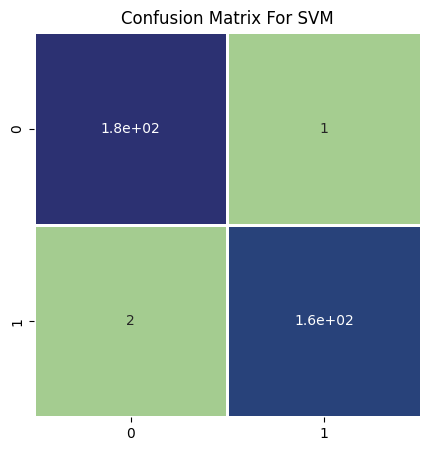

['SVM_parkinson.pkl']

In [28]:
print("Results for SVM")
target_names = ['class 0', 'class 1']
report = classification_report(ytest, y_pred_svc, target_names=target_names,zero_division=0)
print(report)

train_accuracy_svm = accuracy_score(ytrain, clf_svc.predict(xtrain_scale))
test_accuracy_svm = accuracy_score(ytest, clf_svc.predict(xtest_scale))

print(f"Training Accuracy: {train_accuracy_svm:.4f}")
print(f"Test Accuracy: {test_accuracy_svm:.4f}")

cv_scores = cross_val_score(clf_svc, xtrain_scale, ytrain, cv=5)
print(f"Cross-Validation Scores: {cv_scores}")
print(f"Average CV Score: {cv_scores.mean()}")

#confusion Matrix
cm_svc = confusion_matrix(y_pred_svc,ytest)
plt.figure(figsize=(5,5))
sns.heatmap(cm_svc,annot=True,cbar=False,cmap='crest',linewidth=2)
plt.title("Confusion Matrix For SVM")
plt.savefig("svm_cfm.png")
plt.show()

#save the model

joblib.dump(clf_svc,'SVM_parkinson.pkl')

# svc_bestparam = clf_svc.best_params_
# svc_bestacc = clf_svc.best_score_

# LOGISTIC REGRESSION

In [47]:
from sklearn.linear_model import LogisticRegression

clf_lr = LogisticRegression(penalty = 'l2',max_iter = 1000,random_state = 10)

start = time.time()
clf_lr.fit(xtrain_scale,ytrain)
end = time.time()
lr_time = end -start
ypred_lr = clf_lr.predict(xtest_scale)


In [48]:
accuracy_lr = accuracy_score(ytest,ypred_lr)
print("Accuracy of Logistic Regression = ",accuracy_lr)

Accuracy of Logistic Regression =  1.0


Results for Logistic Regression
              precision    recall  f1-score   support

     class 0       1.00      1.00      1.00       181
     class 1       1.00      1.00      1.00       163

    accuracy                           1.00       344
   macro avg       1.00      1.00      1.00       344
weighted avg       1.00      1.00      1.00       344

Training Accuracy: 0.5316
Test Accuracy: 0.5610
Cross-Validation Scores: [1. 1. 1. 1. 1.]
Average CV Score: 1.0


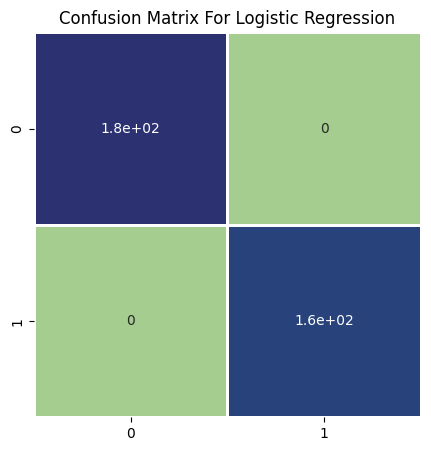

['LR_parkinson.pkl']

In [49]:
print("Results for Logistic Regression")
target_names = ['class 0', 'class 1']
report = classification_report(ytest, ypred_lr, target_names=target_names,zero_division=0)
print(report)

train_accuracy_lr = accuracy_score(ytrain, clf_lr.predict(xtrain))
test_accuracy_lr = accuracy_score(ytest, clf_lr.predict(xtest))

print(f"Training Accuracy: {train_accuracy_lr:.4f}")
print(f"Test Accuracy: {test_accuracy_lr:.4f}")

cv_scores = cross_val_score(clf_lr, xtrain_scale, ytrain, cv=5)
print(f"Cross-Validation Scores: {cv_scores}")
print(f"Average CV Score: {cv_scores.mean()}")

#confusion Matrix
cm_knn = confusion_matrix(ypred_lr,ytest)
plt.figure(figsize=(5,5))
sns.heatmap(cm_knn,annot=True,cbar=False,cmap='crest',linewidth=2)
plt.title("Confusion Matrix For Logistic Regression")
plt.savefig("lr_cfm.png")
plt.show()

#save the model

joblib.dump(clf_svc,'LR_parkinson.pkl')

# Navie Bayes

In [43]:
from sklearn.naive_bayes import GaussianNB
clf_bay = GaussianNB()
start  = time.time()
clf_bay.fit(xtrain_scale,ytrain)
end = time.time()
bay_time = end - start

ypred_bay = clf_bay.predict(xtest_scale)


In [44]:
accuracy_bay = accuracy_score(ytest,ypred_bay)
print("Accuracy of Naive Bayes = ",accuracy_bay)

Accuracy of Naive Bayes =  0.997093023255814


Results for Naive Bayes
              precision    recall  f1-score   support

     class 0       1.00      0.99      1.00       181
     class 1       0.99      1.00      1.00       163

    accuracy                           1.00       344
   macro avg       1.00      1.00      1.00       344
weighted avg       1.00      1.00      1.00       344

Training Accuracy: 0.5129
Test Accuracy: 0.4738
Cross-Validation Scores: [1. 1. 1. 1. 1.]
Average CV Score: 1.0


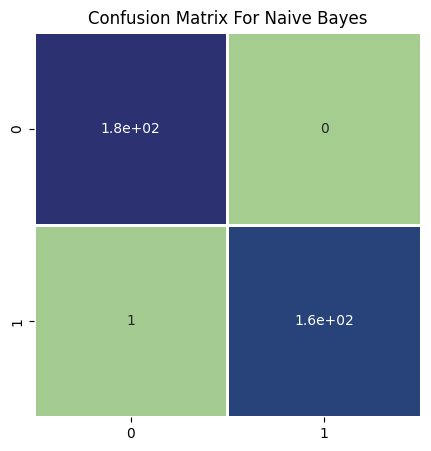

['bayes_parkinson.pkl']

In [45]:
print("Results for Naive Bayes")
target_names = ['class 0', 'class 1']
report = classification_report(ytest, ypred_bay, target_names=target_names,zero_division=0)
print(report)

train_accuracy_bay = accuracy_score(ytrain, clf_bay.predict(xtrain))
test_accuracy_bay = accuracy_score(ytest, clf_bay.predict(xtest))

print(f"Training Accuracy: {train_accuracy_bay:.4f}")
print(f"Test Accuracy: {test_accuracy_bay:.4f}")

cv_scores = cross_val_score(clf_lr, xtrain_scale, ytrain, cv=5)
print(f"Cross-Validation Scores: {cv_scores}")
print(f"Average CV Score: {cv_scores.mean()}")

#confusion Matrix
cm_knn = confusion_matrix(ypred_bay,ytest)
plt.figure(figsize=(5,5))
sns.heatmap(cm_knn,annot=True,cbar=False,cmap='crest',linewidth=2)
plt.title("Confusion Matrix For Naive Bayes")
plt.savefig("bay_cfm.png")
plt.show()

#save the model

joblib.dump(clf_bay,'bayes_parkinson.pkl')

# RANDOM FOREST

In [35]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()
param_grid_rf = {
    'n_estimators': [100, 200, 300],  # Number of trees
    'criterion': ['gini', 'entropy'],
    'max_depth': [None,5 , 10, 20, 30] 
}
rf_clf = GridSearchCV(rf, param_grid_rf, cv=5, scoring='accuracy', n_jobs=-1)
# rf = RandomForestClassifier(criterion='entropy',
#  max_depth= 5,
#  max_features= 'log2',
#  n_estimators= 100,
#  random_state= 150)
start = time.time()
rf_clf.fit(xtrain_scale,ytrain)
end = time.time()
rf_time = end-start
ypred_randomforest = rf_clf.predict(xtest_scale)
accuracy_rf = accuracy_score(ytest,ypred_randomforest)
print("Accuracy for Random Forest =",accuracy_rf)

Accuracy for Random Forest = 1.0


Results for Random Forest
              precision    recall  f1-score   support

     class 0       1.00      1.00      1.00       181
     class 1       1.00      1.00      1.00       163

    accuracy                           1.00       344
   macro avg       1.00      1.00      1.00       344
weighted avg       1.00      1.00      1.00       344

Training Accuracy: 1.0000
Test Accuracy: 1.0000
Cross-Validation Scores: [1. 1. 1. 1. 1.]
Average CV Score: 1.0


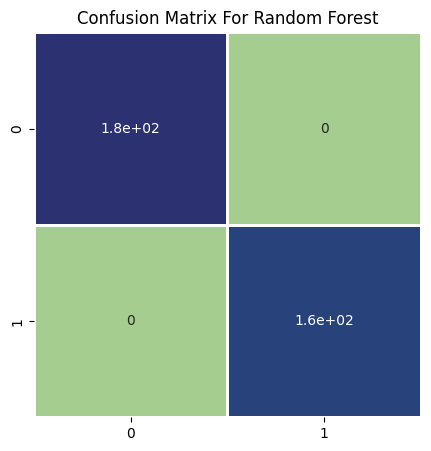

['rf_parkinson.pkl']

In [36]:
print("Results for Random Forest")
target_names = ['class 0', 'class 1']
report = classification_report(ytest, ypred_randomforest,zero_division=0, target_names = target_names)
print(report)

train_accuracy_rf = accuracy_score(ytrain, rf_clf.predict(xtrain_scale))
test_accuracy_rf = accuracy_score(ytest, rf_clf.predict(xtest_scale))

print(f"Training Accuracy: {train_accuracy_rf:.4f}")
print(f"Test Accuracy: {test_accuracy_rf:.4f}")

cv_scores = cross_val_score(rf_clf, xtrain_scale, ytrain, cv=5)
print(f"Cross-Validation Scores: {cv_scores}")
print(f"Average CV Score: {cv_scores.mean()}")

#confusion Matrix
cm_knn = confusion_matrix(ypred_randomforest,ytest, labels = [0,1])
plt.figure(figsize=(5,5))
sns.heatmap(cm_knn,annot=True,cbar=False,cmap='crest',linewidth=2)
plt.title("Confusion Matrix For Random Forest")
plt.savefig("rf_cfm.png")
plt.show()

#save the model

joblib.dump(rf_clf,'rf_parkinson.pkl')

# Final Comaparitive Results & Evaluation

In [37]:
print("The Classification Models used are: \n1. K Nearest Neighbours\n2. Random Forest\n3. Support Vector Machine\n4. Logistic Regression\n5. Naive Bayes")
print("\nAccuracy Comparison : \n")
models = ["K Nearest Neighbours", 'Random Forest' , 'Support Vector Machine' , 'Logistic Regression', 'Naive Bayes']
accuracy = [accuracy_knn, accuracy_rf, accuracy_svc, accuracy_lr, accuracy_bay]
index = 0
for name in models:
    print(f"Accuracy of {name} is : {(accuracy[index])*100}%")
    index += 1

The Classification Models used are: 
1. K Nearest Neighbours
2. Random Forest
3. Support Vector Machine
4. Logistic Regression
5. Naive Bayes

Accuracy Comparison : 

Accuracy of K Nearest Neighbours is : 96.22093023255815%
Accuracy of Random Forest is : 100.0%
Accuracy of Support Vector Machine is : 99.12790697674419%
Accuracy of Logistic Regression is : 100.0%
Accuracy of Naive Bayes is : 98.83720930232558%


In [38]:
print("\nTraining Time Comparison : \n")
models = ["K Nearest Neighbours", 'Random Forest' , 'Support Vector Machine' , 'Logistic Regression', 'Naive Bayes']
accuracy = [knn_time, rf_time, svc_time, lr_time, bay_time]
index = 0
for name in models:
    print(f"Computational Time of {name} is : {(accuracy[index])*100}s")
    index += 1


Training Time Comparison : 

Computational Time of K Nearest Neighbours is : 35.61396598815918ms
Computational Time of Random Forest is : 3787.434411048889ms
Computational Time of Support Vector Machine is : 2.356266975402832ms
Computational Time of Logistic Regression is : 53.9860725402832ms
Computational Time of Naive Bayes is : 0.035262107849121094ms


## Training vs Validation Accuracy Plot

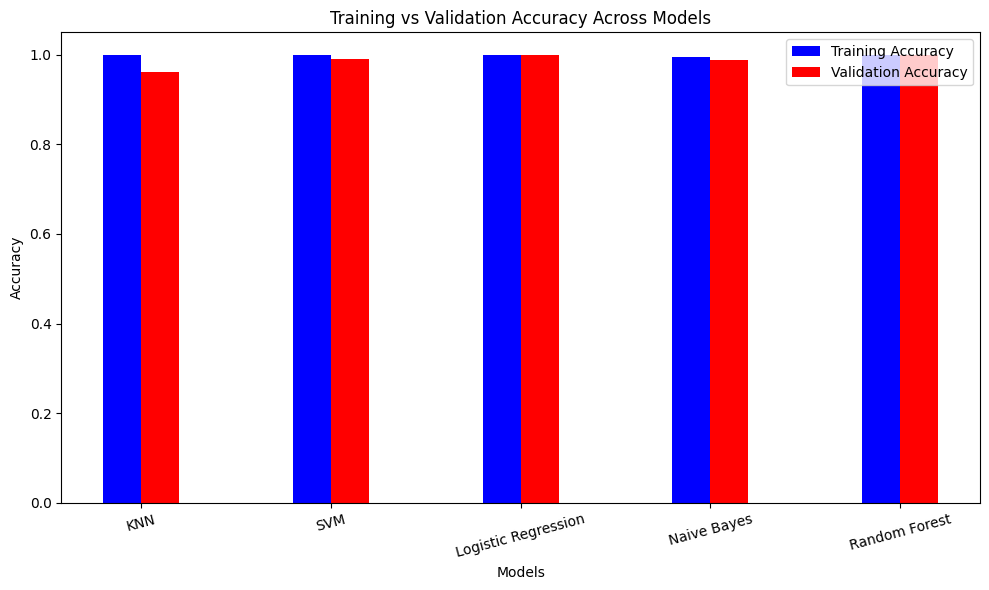

<Figure size 640x480 with 0 Axes>

In [39]:
models = ['KNN', 'SVM' , 'Logistic Regression','Naive Bayes', 'Random Forest']
training_accuracy = [train_accuracy_knn,train_accuracy_svm,train_accuracy_lr,train_accuracy_bay,train_accuracy_rf]
validation_accuracy = [test_accuracy_knn,test_accuracy_svm,test_accuracy_lr,test_accuracy_bay,test_accuracy_rf]

# Plotting
bar_width = 0.2
index = np.arange(len(models))

plt.figure(figsize=(10,6))
plt.bar(index, training_accuracy, bar_width, label='Training Accuracy', color='blue')
plt.bar(index + bar_width, validation_accuracy, bar_width, label='Validation Accuracy', color='red')

# Customization
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Training vs Validation Accuracy Across Models')
plt.xticks(index + bar_width / 2, models, rotation=15)
plt.ylim(0, 1.05)
plt.legend()
plt.tight_layout()
plt.show()
plt.savefig('Train vs valid accuracy.png')

## ROC AUC Plot for Model Metrics

## CV SCORES PLOT

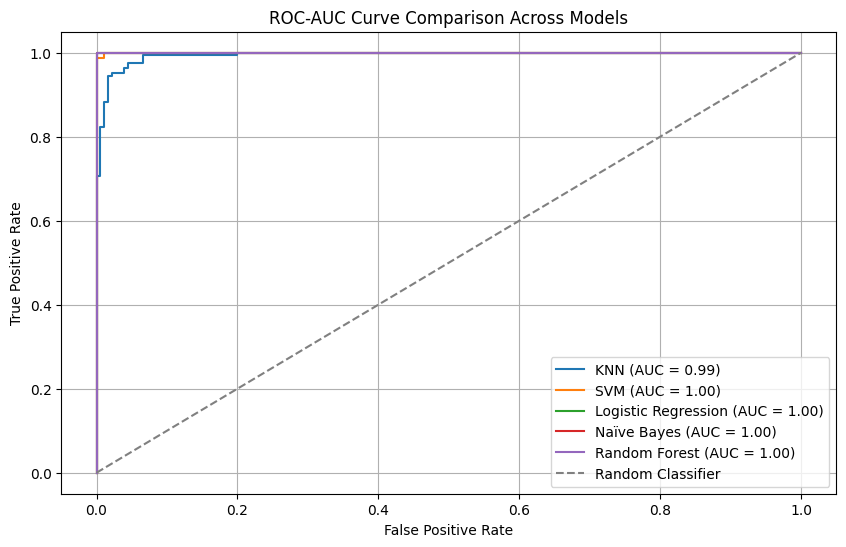

<Figure size 640x480 with 0 Axes>

In [58]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Define model names and corresponding classifiers
model_names = ["KNN", "SVM", "Logistic Regression", "Naïve Bayes", "Random Forest"]
models = [clf_knn, clf_svc, clf_lr, clf_bay, rf_clf]

plt.figure(figsize=(10, 6))

for model_name, model in zip(model_names, models):
    if model_name == "SVM":
        y_scores = model.decision_function(xtest_scale)  # Use decision function for SVM
    else:
        y_scores = model.predict_proba(xtest_scale)[:, 1]  # Use probability estimates for other models

    fpr, tpr, _ = roc_curve(ytest, y_scores)  # Compute ROC curve
    roc_auc = auc(fpr, tpr)  # Compute AUC score

    plt.plot(fpr, tpr, label=f"{model_name} (AUC = {roc_auc:.2f})")

# Plot baseline reference line (random classifier)
plt.plot([0, 1], [0, 1], linestyle="--", color="gray", label="Random Classifier")

# Customize the plot
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC-AUC Curve Comparison Across Models")
plt.legend()
plt.grid()

# Show the plot
plt.show()
plt.savefig('ROC.png')
# Loop through models to generate ROC-AUC curves
# for model_name, model in zip(model_names, models):
#     y_probs = model.predict_proba(xtest_scale)[:, 1]  # Get probability estimates
#     fpr, tpr, _ = roc_curve(ytest, y_probs)  # Compute ROC curve
#     roc_auc = auc(fpr, tpr)  # Compute AUC score
    
#     plt.plot(fpr, tpr, label=f"{model_name} (AUC = {roc_auc:.2f})")

                     precision    recall  f1-score  support
KNN                   0.962316  0.962209  0.962189    344.0
SVM                   0.991298  0.991279  0.991280    344.0
Logistic Regression   1.000000  1.000000  1.000000    344.0
Naïve Bayes           0.997111  0.997093  0.997093    344.0
Random Forest         1.000000  1.000000  1.000000    344.0


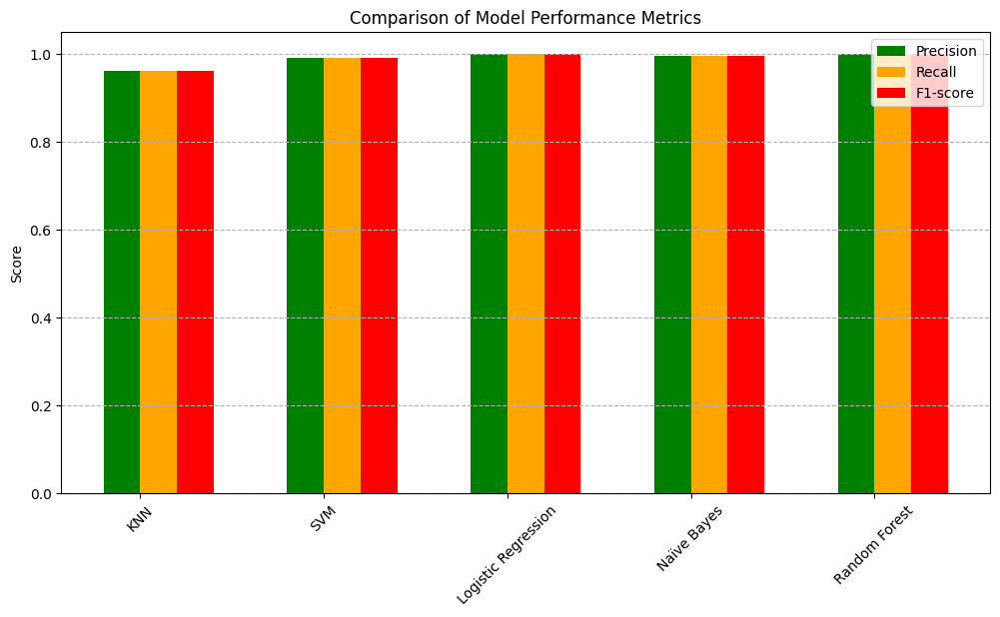

In [51]:
from sklearn.metrics import classification_report
import pandas as pd

# Define model names and corresponding classifiers
model_names = ["KNN", "SVM", "Logistic Regression", "Naïve Bayes", "Random Forest"]
models = [clf_knn, clf_svc, clf_lr, clf_bay, rf_clf]

# Storage for classification reports
classification_reports = {}

# Generate classification reports for each model
for name, model in zip(model_names, models):
    y_pred = model.predict(xtest_scale)  # Make predictions
    report = classification_report(ytest, y_pred, output_dict=True, zero_division=0)  # Get structured report
    classification_reports[name] = report

# Convert reports into a structured DataFrame
df_metrics = pd.DataFrame.from_dict({name: classification_reports[name]["weighted avg"] for name in model_names}, orient="index")

# Display the classification report table
print(df_metrics)

# Plot bar chart
plt.figure(figsize=(12, 6))
x = np.arange(len(model_names))
width = 0.2  # Bar width for grouping

# plt.bar(x - width*1.5, df_metrics["Aaccuracy"], width, label="Accuracy", color="blue")
plt.bar(x - width/2, df_metrics["precision"], width, label="Precision", color="green")
plt.bar(x + width/2, df_metrics["recall"], width, label="Recall", color="orange")
plt.bar(x + width*1.5, df_metrics["f1-score"], width, label="F1-score", color="red")

# Customize the chart
plt.xticks(x, model_names, rotation=45)
plt.ylabel("Score")
plt.title("Comparison of Model Performance Metrics")
plt.legend()
plt.grid(axis="y", linestyle="--")

# Show the plot
plt.show()


## Training Time Comparison

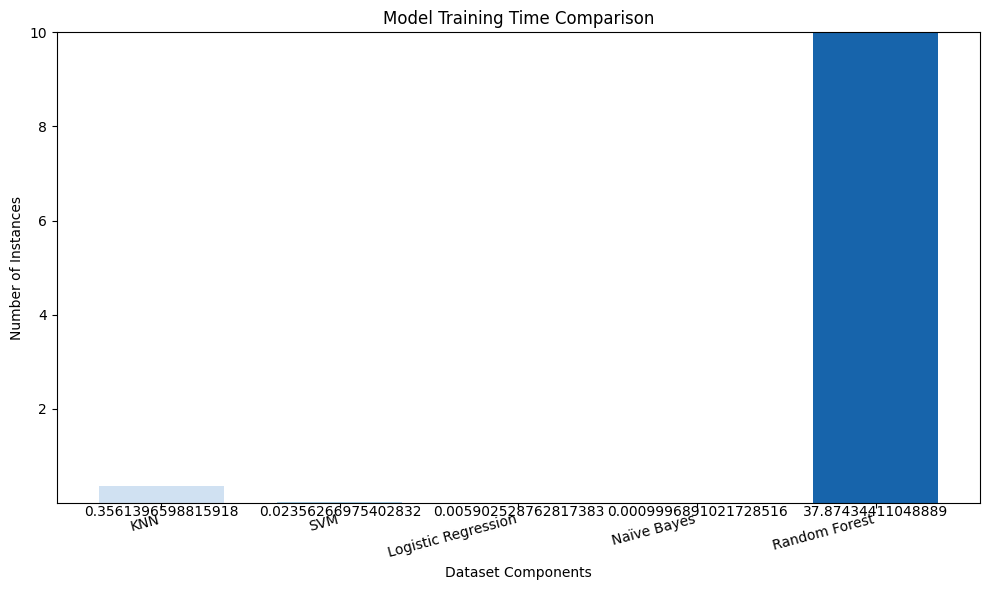

In [52]:
model_names = ["KNN", "SVM", "Logistic Regression", "Naïve Bayes", "Random Forest"]
accuracy = [knn_time, svc_time, lr_time, bay_time,rf_time]

model_dict = dict(zip(model_names, accuracy))

labels = list(model_dict.keys())
values = list(model_dict.values())

# Create the bar chart
x = np.arange(len(labels))  # the label locations
width = 0.7  # the width of the bars
fig, ax = plt.subplots(figsize=(10, 6))
rects = ax.bar(x, values, width, label='Number of Instances', color=plt.cm.Blues(np.linspace(0.2, 0.8, len(values))))

# Add some text for labels, title and axes ticks
ax.set_ylabel('Number of Instances')
ax.set_xlabel('Dataset Components')
ax.set_title('Model Training Time Comparison')
ax.set_xticks(x)
ax.set_xticklabels(labels)

# Add the values on top of each bar
# def autolabel(rects):
#     for rect in rects:
#         height = rect.get_height()
#         ax.annotate('{}'.format(height),
#                     xy=(rect.get_x() + rect.get_width() / 2, height),
#                     xytext=(0, 3),  # 3 points vertical offset
#                     textcoords="offset points",
#                     ha='center', va='bottom')
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, rect.get_y()),  # Position at the base
                    xytext=(0, -12),  # Offset downwards
                    textcoords="offset points",
                    ha='center', va='bottom')  # Align text at the top of annotation
ax.set_xticklabels(labels, rotation=15, ha='right')

autolabel(rects)
plt.ylim(0.0003,10)
# Show the plot
plt.tight_layout()
plt.savefig("DatasetShapeOverview.png")
plt.show()

##### #Column Transplant

In [53]:
# targetcol_test = testdf.iloc[ : ,27]
# targetcol_test.value_counts()

In [54]:
# testdf.iloc[:,27] = df.iloc[:len(testdf),27]

In [55]:
# testdf.head()

In [56]:
# testdf.insert(loc = 28,column = 28,value = targetcol_test.values)

In [57]:
# testdf.iloc[:,28] = testdf2.iloc[:,27]
# testdf.head()